OpenMM Homework3

In [3]:
# Install mmdetection
!rm -rf mmdetection
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
!git clone -b tutorials https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

%pip install -e .

Cloning into 'mmdetection'...
fatal: unable to access 'https://github.com/open-mmlab/mmdetection.git/': gnutls_handshake() failed: The TLS connection was non-properly terminated.
[Errno 2] No such file or directory: 'mmdetection'
/workspace/openmmhomework3
ERROR: File "setup.py" or "setup.cfg" not found. Directory cannot be installed in editable mode: /workspace/openmmhomework3
Note: you may need to restart the kernel to use updated packages.


In [7]:
import os
os.chdir('/workspace/openmmhomework3/mmdetection')

In [13]:
pwd

'/workspace/openmmhomework3/mmdetection'

In [11]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet

# 环境信息收集和打印
def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.8.12 (default, Oct 12 2021, 13:49:34) [GCC 7.5.0]
CUDA available: True
numpy_random_seed: 2471612566
GPU 0: NVIDIA GeForce RTX 2070
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.3, V11.3.109
GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
PyTorch: 1.10.1+cu113
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-genco

1. 数据集准备和可视化


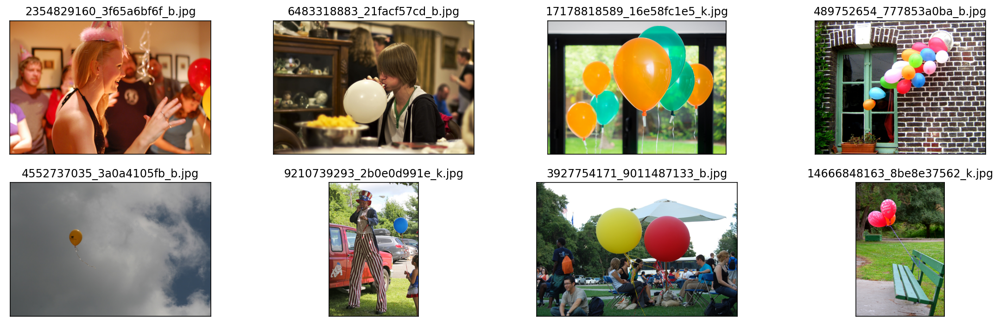

In [1]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir('/workspace/openmmhomework3/data/balloon/train/')][2:10]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open('/workspace/openmmhomework3/data/balloon/train/'+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

In [13]:
import os
os.chdir('/workspace/openmmhomework3/')
!python custom2coco.py

Traceback (most recent call last):
  File "custom2coco.py", line 89, in <module>
    cutom2coco(
  File "custom2coco.py", line 45, in cutom2coco
    cutom_json = mmcv.load(json_path)
AttributeError: module 'mmcv' has no attribute 'load'


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


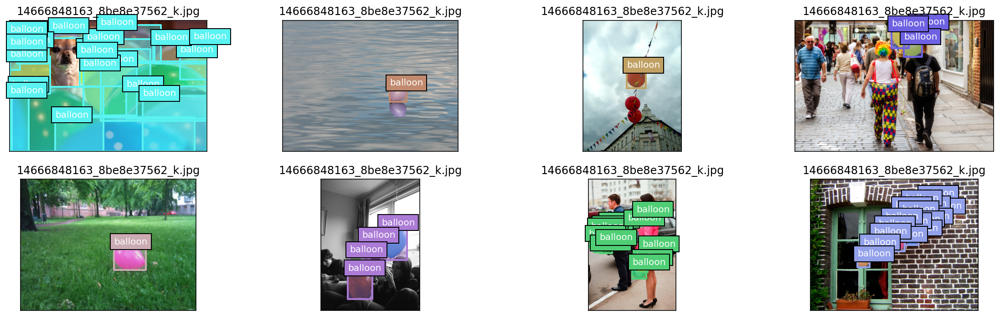

In [2]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
# coco = COCO('cat_dataset/annotations/test.json')
coco = COCO('/workspace/openmmhomework3/data/balloon/train/annotation_coco.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    # image_path = osp.join('cat_dataset/images/',image_data['file_name'])
    image_path = osp.join('/workspace/openmmhomework3/data/balloon/train',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()    

2. 自定义配置文件


In [3]:
os.chdir('/workspace/openmmhomework3/mmdetection/tutorials')
!pwd

/workspace/openmmhomework3/mmdetection/tutorials


In [42]:
# 当前路径位于 mmdetection/tutorials, 配置将写到 mmdetection/tutorials 路径下

config_balloon = """
_base_ = 'configs/rtmdet/rtmdet_tiny_8xb32-300e_coco.py'

# data_root = 'cat_dataset/'
data_root = '/workspace/openmmhomework3/data/balloon'

# 非常重要
metainfo = {
    # 类别名，注意 classes 需要是一个 tuple，因此即使是单类，
    # 你应该写成 `balloon,` 很多初学者经常会在这犯错
    'classes': ('balloon',),
    'palette': [
        (220, 20, 60),
    ]
}
num_classes = 1

# 训练 40 epoch
max_epochs = 40
# 训练单卡 bs= 12
train_batch_size_per_gpu = 12
# 可以根据自己的电脑修改
train_num_workers = 2

# 验证集 batch size 为 1
val_batch_size_per_gpu = 1
val_num_workers = 2

# RTMDet 训练过程分成 2 个 stage，第二个 stage 会切换数据增强 pipeline
num_epochs_stage2 = 5

# batch 改变了，学习率也要跟着改变， 0.004 是 8卡x32 的学习率
base_lr = 12 * 0.004 / (32*8)

# 采用 COCO 预训练权重
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'  # noqa

model = dict(
    # 考虑到数据集太小，且训练时间很短，我们把 backbone 完全固定
    # 用户自己的数据集可能需要解冻 backbone
    backbone=dict(frozen_stages=4),
    # 不要忘记修改 num_classes
    bbox_head=dict(dict(num_classes=num_classes)))

# 数据集不同，dataset 输入参数也不一样
train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    pin_memory=False,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        ann_file='/workspace/openmmhomework3/data/balloon/train/annotation_coco.json',
        data_prefix=dict(img='images/')))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        metainfo=metainfo,
        data_root=data_root,
        ann_file='/workspace/openmmhomework3/data/balloon/val/annotation_coco.json',
        data_prefix=dict(img='images/')))

test_dataloader = val_dataloader

# 默认的学习率调度器是 warmup 1000，但是 cat 数据集太小了，需要修改 为 30 iter
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=30),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,  # max_epoch 也改变了
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]
optim_wrapper = dict(optimizer=dict(lr=base_lr))

# 第二 stage 切换 pipeline 的 epoch 时刻也改变了
_base_.custom_hooks[1].switch_epoch = max_epochs - num_epochs_stage2

# val_evaluator = dict(ann_file=data_root + 'annotations/test.json')
val_evaluator = dict(ann_file='/workspace/openmmhomework3/data/balloon/val/annotation_coco.json')
test_evaluator = val_evaluator

# 一些打印设置修改
default_hooks = dict(
    checkpoint=dict(interval=10, max_keep_ckpts=2, save_best='auto'),  # 同时保存最好性能权重
    logger=dict(type='LoggerHook', interval=5))
train_cfg = dict(max_epochs=max_epochs, val_interval=10)
"""

with open('rtmdet_tiny_1xb12-40e_balloon.py', 'w') as f:
    f.write(config_balloon)

3. 训练前可视化验证


In [6]:
os.chdir('/workspace/openmmhomework3/mmdetection/')
!pwd

/workspace/openmmhomework3/mmdetection


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
06/11 03:37:59 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/workspace/openmmhomework3/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  scales = 0.5 + (areas - min_area) // (max_area - min_area)
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


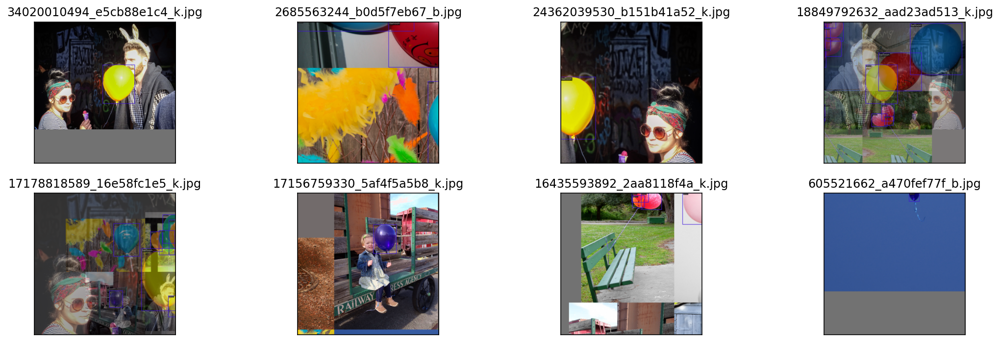

In [7]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('/workspace/openmmhomework3/mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py')

# print("cfg----------------------", cfg)

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(0, 8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()    

4. 模型训练


In [8]:
os.chdir('/workspace/openmmhomework3/mmdetection/')
!pwd

/workspace/openmmhomework3/mmdetection


In [10]:
!python tools/train.py '/workspace/openmmhomework3/mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py'

06/11 03:45:48 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.12 (default, Oct 12 2021, 13:49:34) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 1635848385
    GPU 0: NVIDIA GeForce RTX 2070
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
    PyTorch: 1.10.1+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code

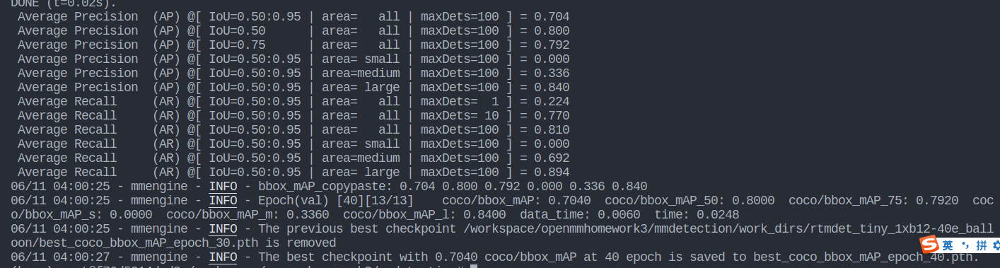

5. 模型测试和推理


In [11]:
os.chdir('/workspace/openmmhomework3/mmdetection/tutorials')
!pwd

/workspace/openmmhomework3/mmdetection/tutorials


In [ ]:
!python tools/test.py '/workspace/openmmhomework3/mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py' '/workspace/openmmhomework3/mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth'

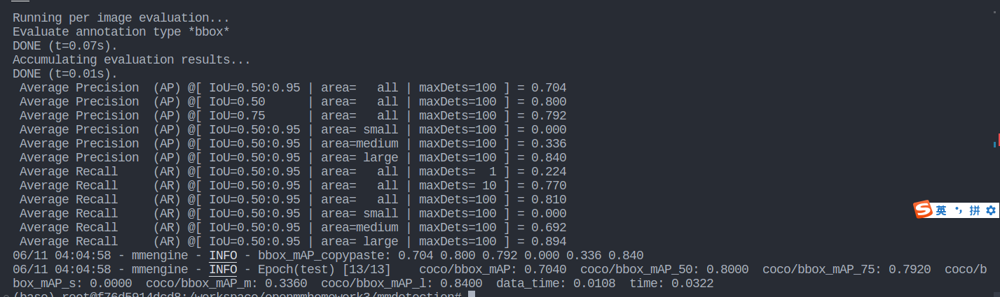

In [ ]:
# 在测试阶段，你可以设置 --show-dir 将测试图片的真实值和预测值保存下来，然后进行深入分析。
!python tools/test.py '/workspace/openmmhomework3/mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py' '/workspace/openmmhomework3/mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_40.pth' --show-dir results

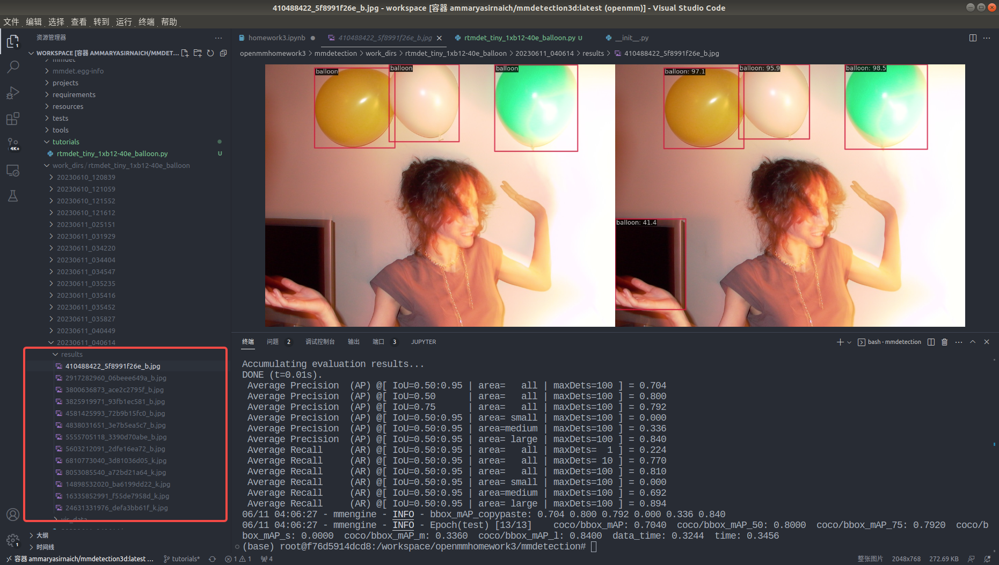

6. 可视化分析

In [ ]:
# install MMYOLO
!pwd
%cd ../
!rm -rf mmyolo
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
!git clone -b tutorials https://github.com/open-mmlab/mmyolo.git 
%cd mmyolo

%pip install -e .
!pwd

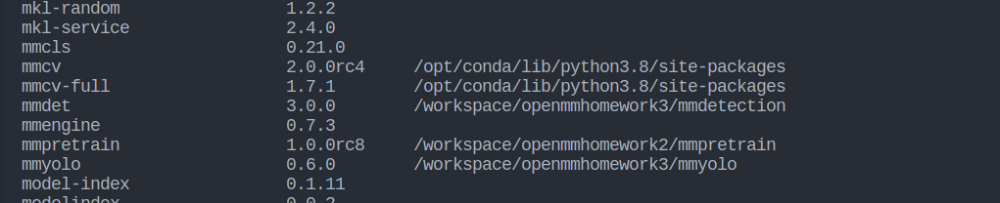

### 特征图可视化

In [15]:
os.chdir('/workspace/openmmhomework3/mmyolo')
!pwd

/workspace/openmmhomework3/mmyolo


In [17]:
import cv2

img = cv2.imread('/workspace/openmmhomework3/data/balloon/val/5603212091_2dfe16ea72_b.jpg')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('/workspace/openmmhomework3/resized_image.jpg', resized_img)

True

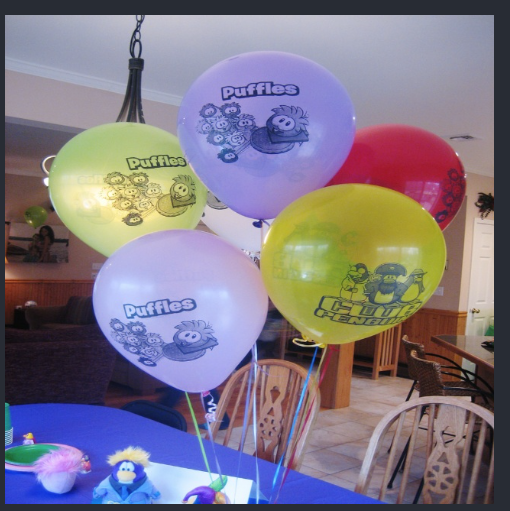

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth
06/11 04:30:12 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/opt/conda/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
/workspace/openmmh

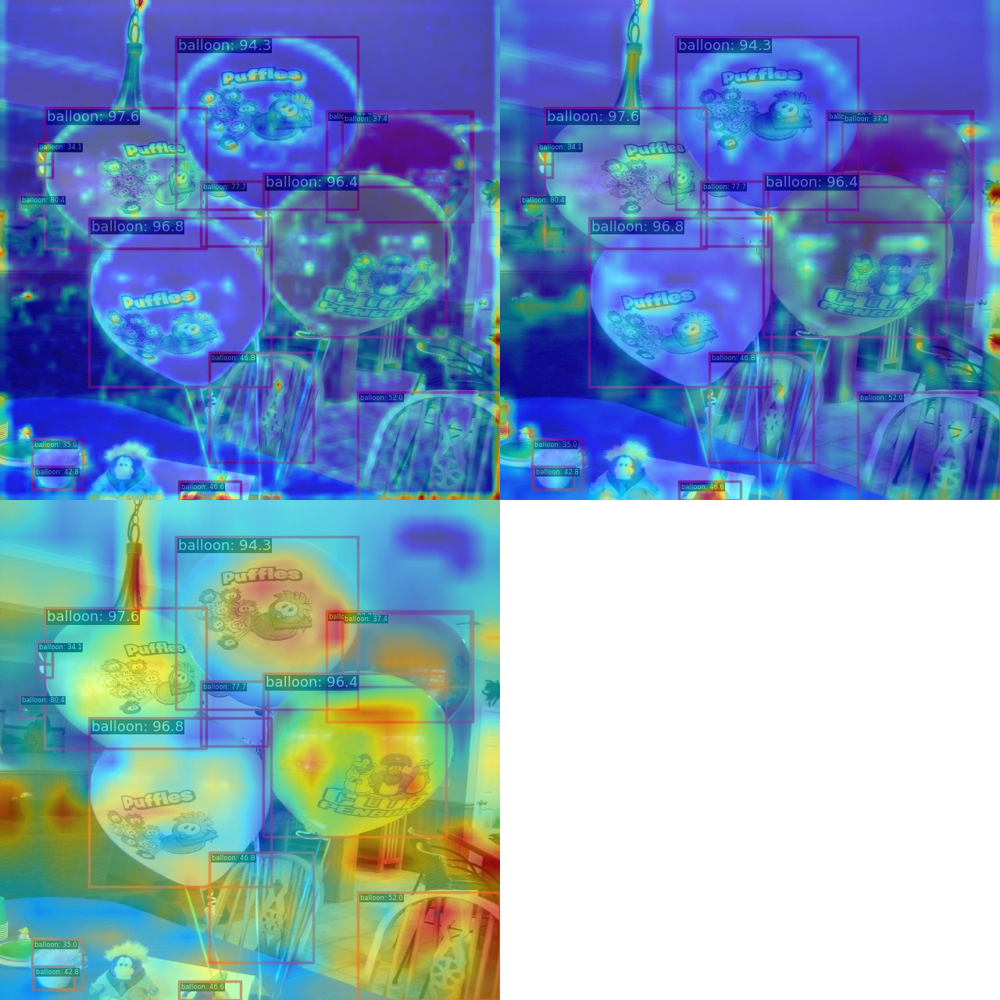

In [19]:
# 可视化 backbone 输出的 3 个通道
!python demo/featmap_vis_demo.py \
      ../resized_image.jpg \
      ../mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth  \
      --target-layers backbone  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')    

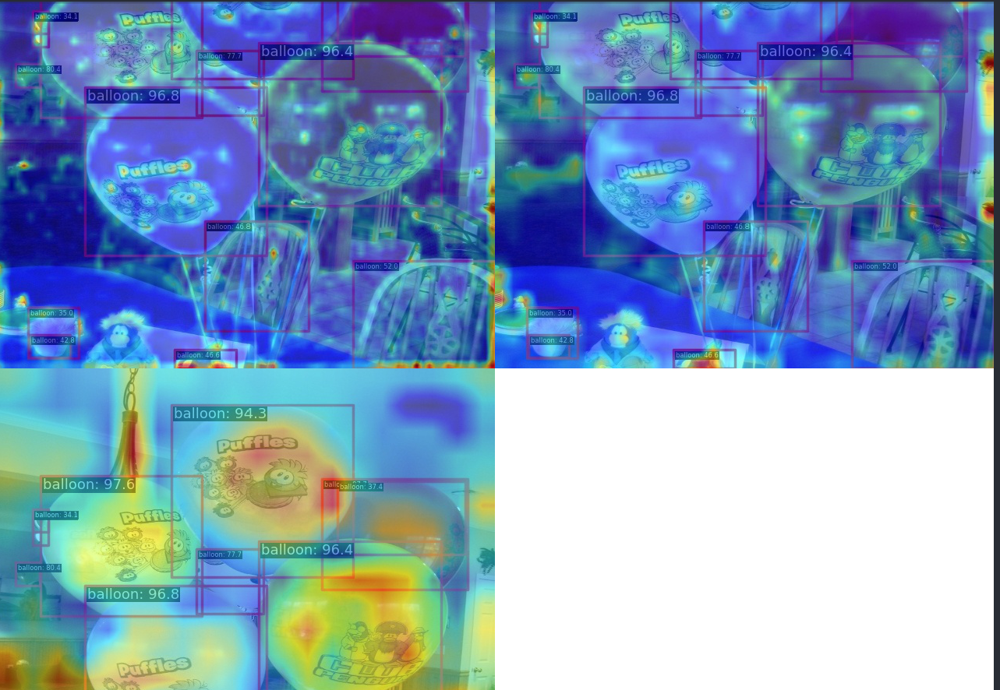

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth
06/11 04:32:48 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/opt/conda/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/opt/conda/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
/workspace/openmmh

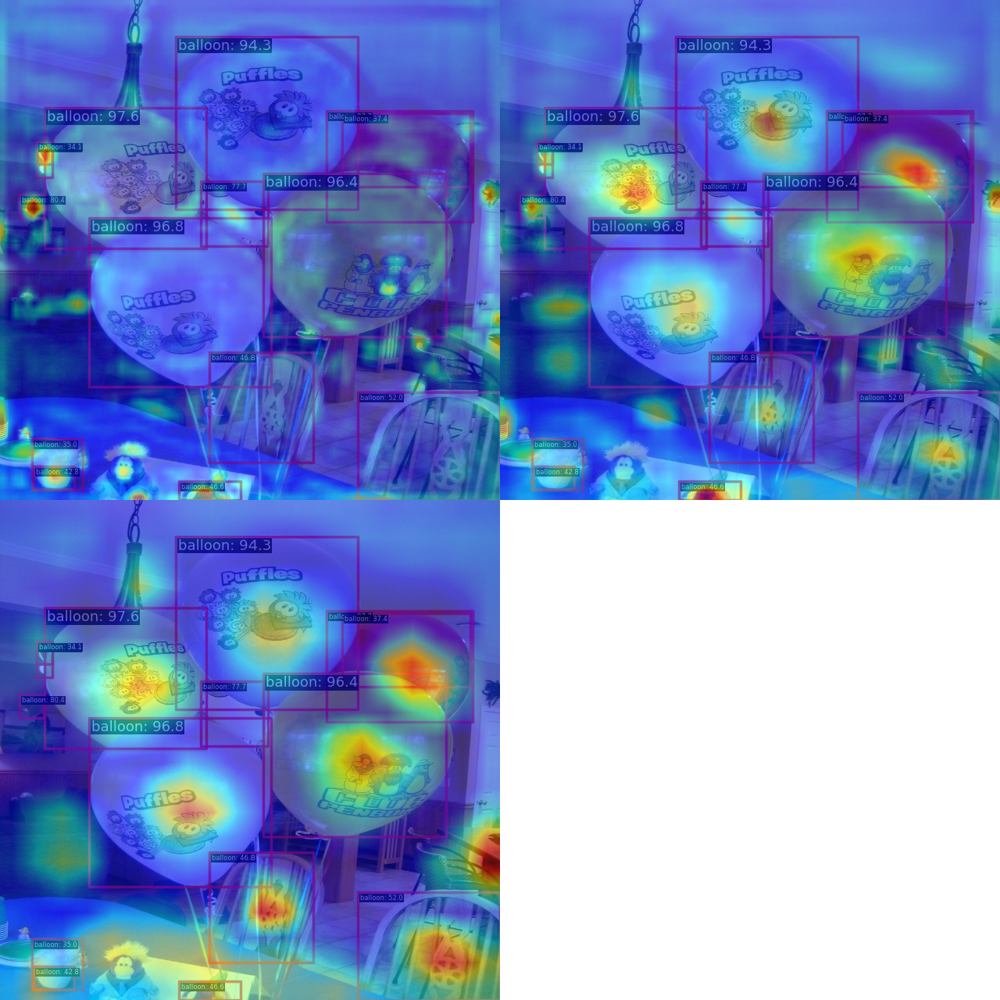

In [21]:
# 可视化 neck 输出的 3 个通道
!python demo/featmap_vis_demo.py \
      ../resized_image.jpg \
      ../mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg') 

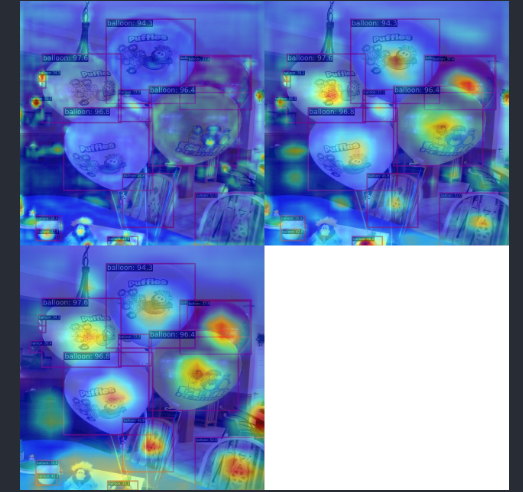

In [ ]:
# Grad-Based CAM 可视化
!pip install "grad-cam"

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/opt/conda/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/opt/conda/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 5.9 task/s, elapsed: 0s, ETA:     0sAll done!
Results have been saved at /workspace/openmmhomework3/mmyolo/out

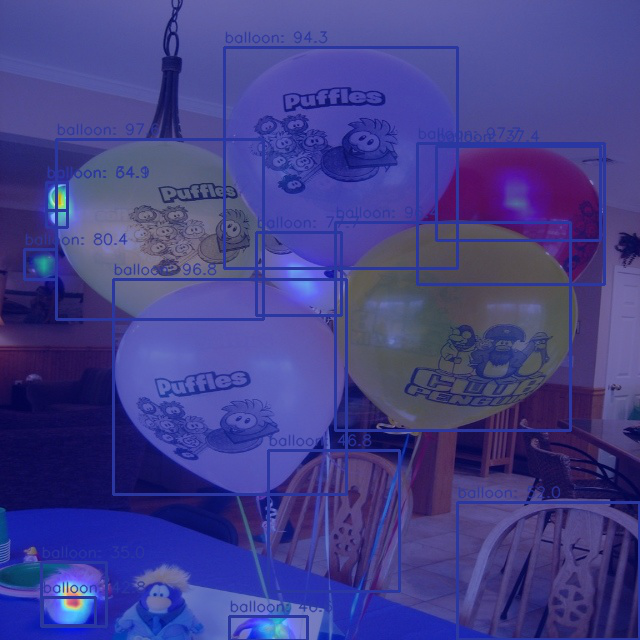

In [22]:
!python demo/boxam_vis_demo.py \
      ../resized_image.jpg \
      ../mmdetection/tutorials/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/epoch_40.pth  \
      --target-layer neck.out_convs[0]
Image.open('output/resized_image.jpg')     

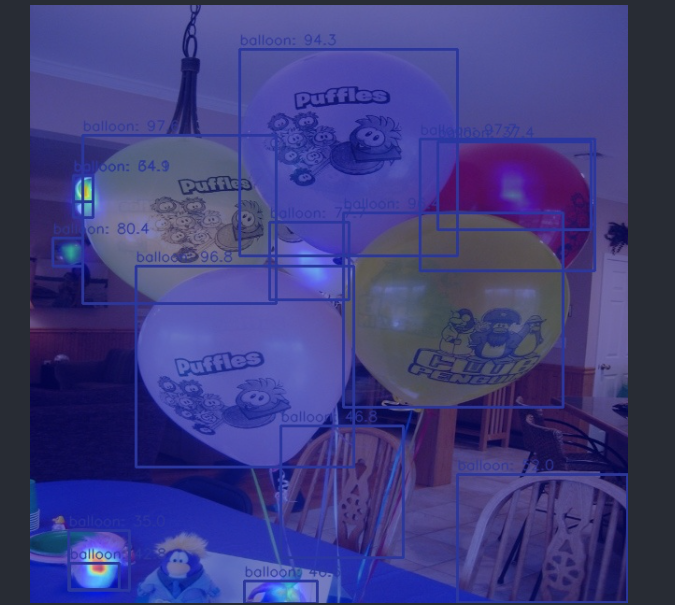